In [1]:
"""
Preparation
"""

%matplotlib inline
import cv2 as cv
import os
from matplotlib import pyplot as plt
import numpy as np
import utils

BASE_DIR = os.getcwd()
SEQ_DIR = os.path.join(os.getcwd(), "assets/real_data_1")
SEQ_SIZE = 122
OUTPUT_IMAGES_DIR = os.path.join(BASE_DIR, "output_images")

def print_cv_images(array, fig_weight, fig_height):
    if (len(array) < 2):
        raise ValueError
    table_height = len(array)
    table_weight = len(array[0])
    fig, table = plt.subplots(table_height, table_weight)
    fig.set_size_inches(fig_weight, fig_height)
    for row in range(table_height):
        for col in range(table_weight):
            table[row][col].imshow(cv.cvtColor(
                array[row][col],
                cv.COLOR_BGR2RGB),
            )

def get_file_number(n, k):
    res = str(n)
    while(len(res) < k):
        res = "0" + res
    return res

(122, 519, 452)


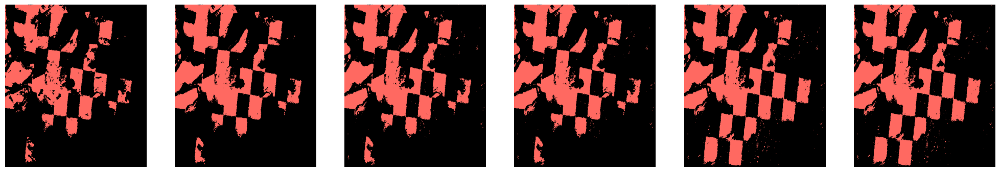

In [5]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
DELTA = 0
cnt = np.zeros(mask.shape[1:], dtype=np.uint16)
res = []
for i in range(SEQ_SIZE - 1, -1, -1):
    cnt += ~mask[i]
    res.append(cnt <= DELTA)
    # res.append(cv.cvtColor(np.uint8(cnt <= DELTA) * 255, v.COLOR_GRAY2RGB))
res = np.array(res[::-1])
print(res.shape)

utils.show_images(utils.images_to_rgb_mask(res[-6:]), fig_size=(25, 5))

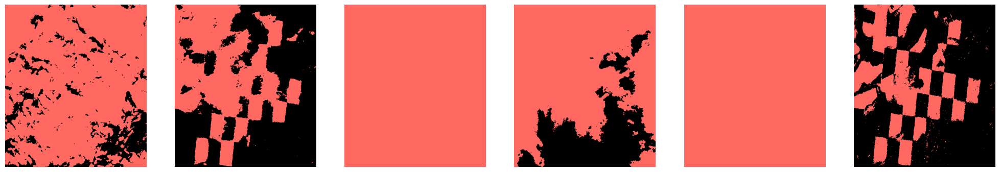

In [7]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
utils.show_images(utils.images_to_rgb_mask(mask[-6:]), fig_size=(25, 5))

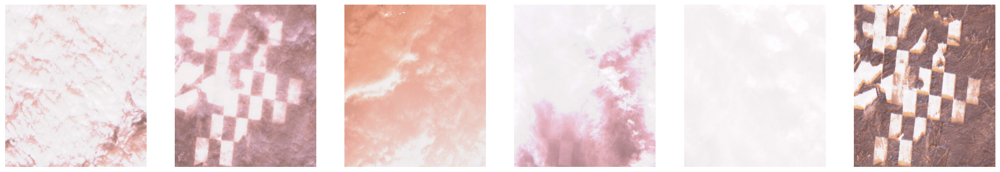

In [4]:
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
utils.show_images(np.array(images[-6:]), fig_size=(25, 5))

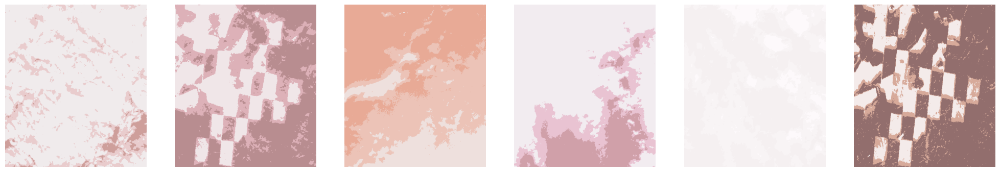

In [2]:
images_to_process = []
for frame in range(SEQ_SIZE):
    images_to_process.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
final_images = utils.process_images(np.array(images_to_process))
utils.show_images(final_images[-6:], fig_size=(25, 5))
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "wb") as f:
    np.save(f, final_images)

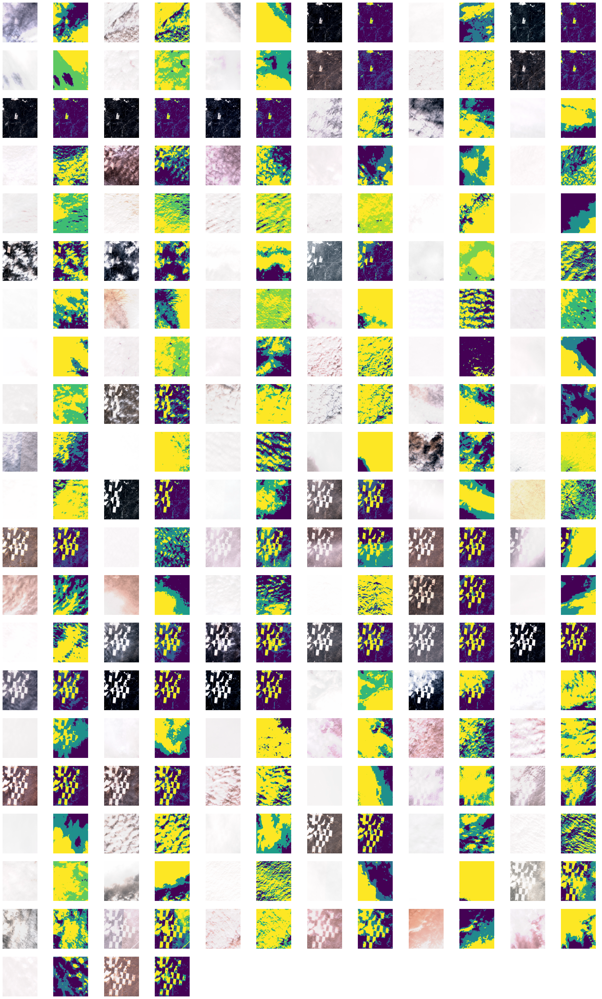

In [3]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
images = np.array(images)
res = []
for i in range(SEQ_SIZE):
    res.append(images[i])
    res.append(mask[i])
utils.show_images(res, fig_size=(30, 50), row_size=12)

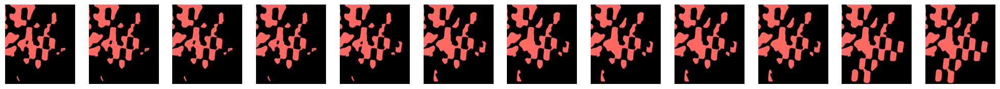

In [15]:
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
DELTA = 0
cnt = np.zeros(mask.shape[1:], dtype=np.uint16)
res = []
for i in range(SEQ_SIZE - 1, -1, -1):
    cnt += ~mask[i]
    res.append(cnt <= DELTA)
res = np.array(res[::-1])
utils.show_images(utils.images_to_rgb_mask(res[-12:]), fig_size=(25, 50), row_size=12)

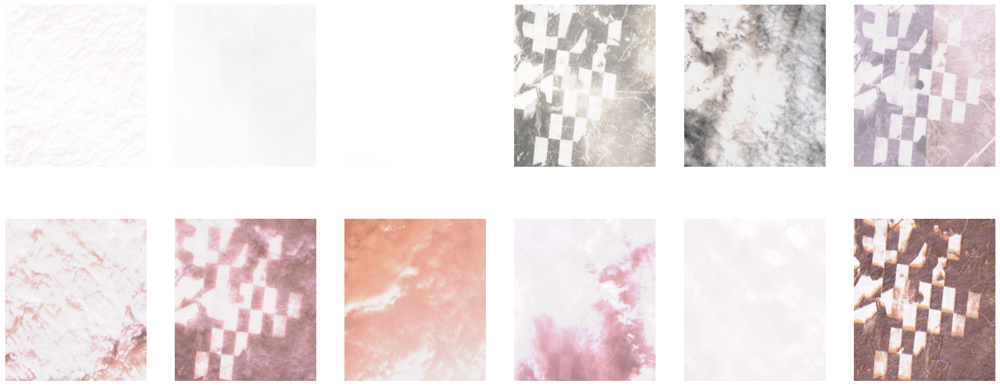

In [9]:
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
utils.show_images(np.array(images[-12:]), fig_size=(25, 10))

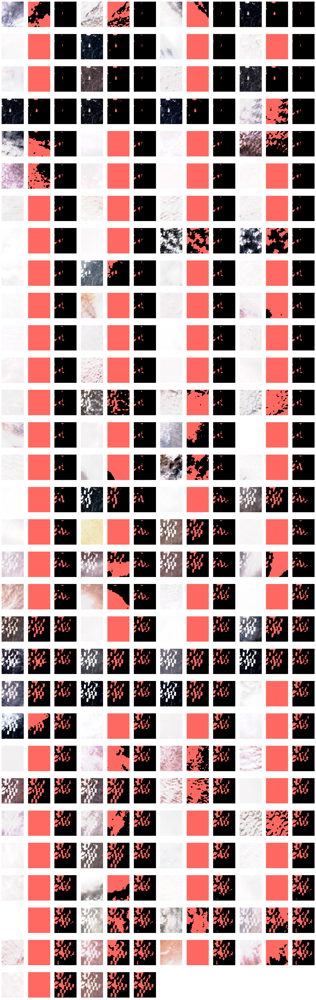

In [41]:
images = []
for frame in range(SEQ_SIZE):
    images.append(cv.imread(os.path.join(SEQ_DIR, f"image_{frame}.png")))
images = np.array(images)
with open(os.path.join(OUTPUT_IMAGES_DIR, "mask_save.npy"), "rb") as f:
    mask = np.load(f)
DELTA = 2
cnt = np.zeros(mask.shape[1:], dtype=np.uint16)
final_images = []
for i in range(SEQ_SIZE - 1, -1, -1):
    cnt += ~mask[i]
    if (i == SEQ_SIZE - 1):
        cnt *= 1000;
    final_images.append(cnt <= DELTA)
final_images = np.array(final_images)[::-1]
res = []
for i in range(len(images)):
    res.append(images[i])
    res.append(utils.image_to_rgb_mask(mask[i]))
    res.append(utils.image_to_rgb_mask(final_images[i]))
utils.show_images(np.array(res), fig_size=(25, 80), row_size=12)